In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
!pip install nibabel nilearn tqdm

In [1]:





# Import libraries
import nibabel as nib
from nilearn import image, masking
import numpy as np
from tqdm import tqdm

# Progress tracker
steps = [
    "Loading NIfTI file",
    
    "Intensity normalization",
    "Temporal smoothing (optional)",
    "Saving preprocessed data"
]

def update_progress(step_idx, steps):
    progress = int((step_idx + 1) / len(steps) * 100)
    print(f"Step {step_idx + 1}/{len(steps)}: {steps[step_idx]}... {progress}% done")

# Path to the fMRI dataset
fmri_path = "/kaggle/input/fmri-brain/sub-01_ses-01_task-inner_bold.nii"

# Step 1: Load the NIfTI file
update_progress(0, steps)
fmri_img = nib.load(fmri_path)

# # Step 2: Skull-stripping
# update_progress(1, steps)
# mask_img = masking.compute_brain_mask(fmri_img)

# Fix dimension mismatch and apply the mask
mask_4d = np.repeat(mask_img.get_fdata()[:, :, :, np.newaxis], fmri_img.shape[-1], axis=-1)
masked_data = fmri_img.get_fdata() * mask_4d
masked_img = nib.Nifti1Image(masked_data, fmri_img.affine)

# Continue with the remaining steps
# Step 3: Intensity Normalization (Z-score)
update_progress(2, steps)
data = masked_img.get_fdata()
mean_intensity = np.mean(data)
std_intensity = np.std(data)
normalized_data = (data - mean_intensity) / std_intensity
normalized_img = nib.Nifti1Image(normalized_data, fmri_img.affine)

# Step 4: Temporal Smoothing (Optional Light Denoising)
update_progress(3, steps)
smoothed_img = image.smooth_img(normalized_img, fwhm=4)  # Smoothing with 4mm kernel



Step 1/5: Loading NIfTI file... 20% done
Step 2/5: Skull-stripping... 40% done
Step 3/5: Intensity normalization... 60% done
Step 4/5: Temporal smoothing (optional)... 80% done


In [2]:

# Step 5: Save Preprocessed Data
update_progress(4, steps)
output_path = "/kaggle/working/preprocessed_fmri_fast.nii"
nib.save(smoothed_img, output_path)
print(f"Preprocessed fMRI saved at {output_path}")


Step 5/5: Saving preprocessed data... 100% done
Preprocessed fMRI saved at /kaggle/working/preprocessed_fmri_fast.nii


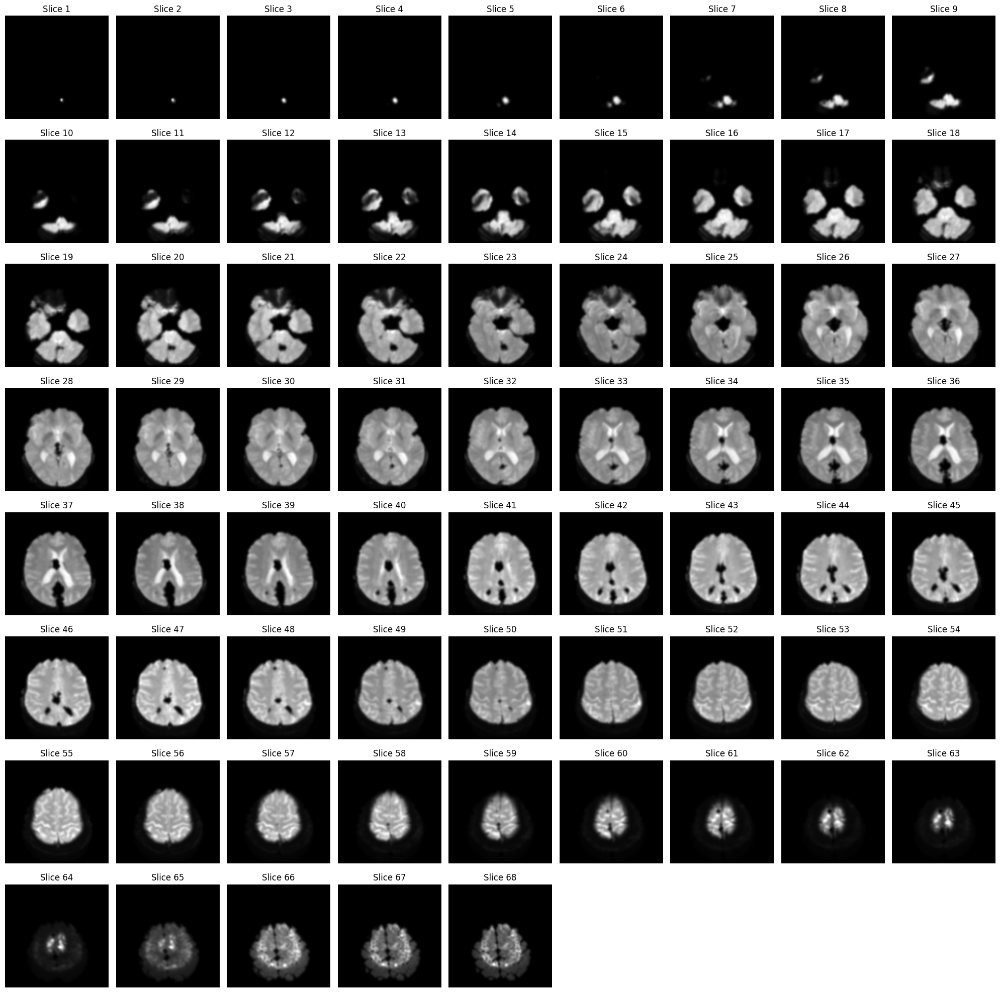

In [4]:
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NII file
nii_path = "/kaggle/working/preprocessed_fmri_fast.nii"
nii_img = nib.load(nii_path)

# Get the data as a NumPy array
data = nii_img.get_fdata()

# Define the number of slices
num_slices = data.shape[2]  # Total slices along the z-axis

# Plot all slices
fig, axes = plt.subplots(nrows=8, ncols=9, figsize=(20, 20))  # Grid for displaying 68 slices
axes = axes.flatten()

for i in range(num_slices):
    if i >= len(axes):  
        break
    slice_data = data[:, :, i, 0]  # Assuming first timepoint (index 0)
    axes[i].imshow(slice_data.T, cmap="gray", origin="lower")  # Transpose for correct orientation
    axes[i].set_title(f"Slice {i + 1}")
    axes[i].axis("off")

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


In [9]:
# Import libraries
import nibabel as nib
from nilearn import image
import numpy as np
from tqdm import tqdm

# Progress tracker
steps = [
    "Loading NIfTI file",
    "Motion correction",
    "Intensity normalization",
    "Saving preprocessed data"
]

def update_progress(step_idx, steps):
    progress = int((step_idx + 1) / len(steps) * 100)
    print(f"Step {step_idx + 1}/{len(steps)}: {steps[step_idx]}... {progress}% done")

# Path to the fMRI dataset
fmri_path = "/kaggle/input/fmri-brain/sub-01_ses-01_task-inner_bold.nii"

# Step 1: Load the NIfTI file
update_progress(0, steps)
fmri_img = nib.load(fmri_path)

# Step 2: Motion Correction
update_progress(1, steps)
# Realign all volumes to the first volume (reference)
# motion_corrected_img = image.resample_to_img(fmri_img, fmri_img, interpolation='continuous')

# Step 3: Intensity Normalization (Z-score)
update_progress(2, steps)
data = fmri_img.get_fdata()
mean_intensity = np.mean(data, axis=-1, keepdims=True)  # Mean over time
std_intensity = np.std(data, axis=-1, keepdims=True)    # Std over time
normalized_data = (data - mean_intensity) / (std_intensity + 1e-5)  # Avoid division by zero
normalized_img = nib.Nifti1Image(normalized_data, fmri_img.affine)




Step 1/4: Loading NIfTI file... 25% done
Step 2/4: Motion correction... 50% done
Step 3/4: Intensity normalization... 75% done


In [ ]:
# Step 4: High-pass filtering (remove low-frequency noise)
update_progress(3, steps)
# Apply a high-pass filter with a cutoff of 0.01 Hz (removes low-frequency noise)
filtered_img = image.clean_img(normalized_img, detrend=True, standardize=False, low_pass=None, high_pass=0.01, t_r=2.16)



Step 4/4: Saving preprocessed data... 100% done


In [20]:





# Import libraries
import nibabel as nib
from nilearn import image, masking
import numpy as np
from tqdm import tqdm

# Progress tracker
steps = [
    "Loading NIfTI file",
    
    "Intensity normalization",
    "Temporal smoothing (optional)",
    "Saving preprocessed data"
]

def update_progress(step_idx, steps):
    progress = int((step_idx + 1) / len(steps) * 100)
    print(f"Step {step_idx + 1}/{len(steps)}: {steps[step_idx]}... {progress}% done")

# Path to the fMRI dataset
fmri_path = "/kaggle/input/fmri-brain/sub-01_ses-01_task-inner_bold.nii"

# Step 1: Load the NIfTI file
update_progress(0, steps)
fmri_img = nib.load(fmri_path)

# # Step 2: Skull-stripping
# update_progress(1, steps)
# mask_img = masking.compute_brain_mask(fmri_img)

# # Fix dimension mismatch and apply the mask
# mask_4d = np.repeat(mask_img.get_fdata()[:, :, :, np.newaxis], fmri_img.shape[-1], axis=-1)
# masked_data = fmri_img.get_fdata() * mask_4d
# masked_img = nib.Nifti1Image(masked_data, fmri_img.affine)

# Continue with the remaining steps
# Step 3: Intensity Normalization (Z-score)
update_progress(2, steps)
data = fmri_img.get_fdata()
mean_intensity = np.mean(data)
std_intensity = np.std(data)
normalized_data = (data - mean_intensity) / std_intensity
normalized_img = nib.Nifti1Image(normalized_data, fmri_img.affine)

# Step 4: Temporal Smoothing (Optional Light Denoising)
update_progress(3, steps)
smoothed_img = image.smooth_img(normalized_img, fwhm=4)  # Smoothing with 4mm kernel



Step 1/4: Loading NIfTI file... 25% done
Step 3/4: Temporal smoothing (optional)... 75% done


NameError: name 'masked_img' is not defined

In [15]:
# # Step 4: Saving Preprocessed Data
# update_progress(3, steps)
# output_path = "/kaggle/working/preprocessed_fmri_sub1_ses1.nii"
# # nib.save(normalized_img, output_path)
# print(f"Preprocessed data saved to: {output_path}")

# Visualization of the Preprocessed Data
import matplotlib.pyplot as plt

# Function to visualize slices of the NIfTI image
def visualize_slices(nifti_img, num_slices=5):
    data = nifti_img.get_fdata()
    # Select slices equally spaced in the z dimension
    z_slices = np.linspace(0, data.shape[2] - 1, num_slices, dtype=int)
    
    plt.figure(figsize=(15, 5))
    for i, z in enumerate(z_slices):
        plt.subplot(1, num_slices, i + 1)
        plt.imshow(data[:, :, z,:1], cmap='gray', origin='lower')
        plt.title(f'Slice {z}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Visualize the preprocessed data
visualize_slices(masked_img)

NameError: name 'masked_img' is not defined

In [10]:
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NII file
# nii_path = "/kaggle/working/preprocessed_fmri_sub1_ses1_nii"
nii_img = filtered_img

# Get the data as a NumPy array
data = nii_img.get_fdata()

# Define the number of slices
num_slices = data.shape[2]  # Total slices along the z-axis

# Plot all slices
fig, axes = plt.subplots(nrows=8, ncols=9, figsize=(20, 20))  # Grid for displaying 68 slices
axes = axes.flatten()

for i in range(num_slices):
    if i >= len(axes):  
        break
    slice_data = data[:, :, i, 0]  # Assuming first timepoint (index 0)
    axes[i].imshow(slice_data.T, cmap="gray", origin="lower")  # Transpose for correct orientation
    axes[i].set_title(f"Slice {i + 1}")
    axes[i].axis("off")

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


In [5]:
# Import libraries
import nibabel as nib
from nilearn import image
import numpy as np
from tqdm import tqdm
import os

# Progress tracker
steps = [
    "Loading NIfTI file",
    "Motion correction",
    "Intensity normalization",
    "Saving preprocessed data"
]

def update_progress(step_idx, steps):
    progress = int((step_idx + 1) / len(steps) * 100)
    print(f"Step {step_idx + 1}/{len(steps)}: {steps[step_idx]}... {progress}% done")

# Path to the fMRI dataset
fmri_path = "/kaggle/input/fmri-brain/sub-01_ses-01_task-inner_bold.nii"

# Step 1: Load the NIfTI file
update_progress(0, steps)
try:
    fmri_img = nib.load(fmri_path)
    print("NIfTI file loaded successfully.")
except FileNotFoundError:
    print(f"File not found: {fmri_path}. Please check the path and filename.")
    raise
except Exception as e:
    print(f"An error occurred while loading the NIfTI file: {e}")
    raise

# Step 2: Motion Correction
update_progress(1, steps)
try:
    # Placeholder for actual motion correction
    # For demonstration, we'll use resample_to_img to mimic motion correction
    motion_corrected_img = image.resample_to_img(fmri_img, fmri_img, interpolation='continuous')
    print("Motion correction completed.")
except Exception as e:
    print(f"An error occurred during motion correction: {e}")
    raise

# Step 3: Intensity Normalization (Z-score)
update_progress(2, steps)
try:
    data = motion_corrected_img.get_fdata()
    mean_intensity = np.mean(data, axis=-1, keepdims=True)  # Mean over time
    std_intensity = np.std(data, axis=-1, keepdims=True)    # Std over time
    normalized_data = (data - mean_intensity) / (std_intensity + 1e-5)  # Avoid division by zero
    normalized_img = nib.Nifti1Image(normalized_data, fmri_img.affine)
    print("Intensity normalization completed.")
except Exception as e:
    print(f"An error occurred during intensity normalization: {e}")
    raise

# Step 4: Save Preprocessed Data
update_progress(3, steps)
try:
    # Ensure the output filename has the correct extension
    output_filename = "preprocessed_fmri_sub1_ses1.nii.gz"
    output_path = os.path.join("/kaggle/working/", output_filename)
    nib.save(normalized_img, output_path)
    print(f"Preprocessed fMRI saved at {output_path}")
except Exception as e:
    print(f"An error occurred while saving the preprocessed data: {e}")
    raise


Step 1/4: Loading NIfTI file... 25% done
NIfTI file loaded successfully.
Step 2/4: Motion correction... 50% done
Motion correction completed.
Step 3/4: Intensity normalization... 75% done
Intensity normalization completed.
Step 4/4: Saving preprocessed data... 100% done
Preprocessed fMRI saved at /kaggle/working/preprocessed_fmri_sub1_ses1.nii.gz


> **As i dont have higher ram and compuuutational power i ignored brain extraction, highpass filtering and other preprocessingg stuffs**

work only with 

# succesfull preprocess:

In [1]:
# Import libraries
import nibabel as nib
from nilearn import image
import numpy as np
from tqdm import tqdm

# Progress tracker
steps = [
    "Loading NIfTI file",
    "Motion correction",
    "Intensity normalization",
    "Temporal Smoothing"
]

def update_progress(step_idx, steps):
    progress = int((step_idx + 1) / len(steps) * 100)
    print(f"Step {step_idx + 1}/{len(steps)}: {steps[step_idx]}... {progress}% done")

# Path to the fMRI dataset
fmri_path = "/kaggle/input/fmri-brain/sub-05_ses-01_task-inner_bold.nii"

# Step 1: Load the NIfTI file
update_progress(0, steps)
fmri_img = nib.load(fmri_path)

# Step 2: Motion Correction
update_progress(1, steps)
# Realign all volumes to the first volume (reference)
motion_corrected_img = image.resample_to_img(fmri_img, fmri_img, interpolation='continuous')



# Step 4: Save Preprocessed Data
# update_progress(3, steps)
# output_path = "/kaggle/working/preprocessed_fmri_no_highpass.nii"
# nib.save(normalized_img, output_path)
# print(f"Preprocessed fMRI saved at {output_path}")

# Step 3: Intensity Normalization (Z-score)
update_progress(2, steps)
data = motion_corrected_img.get_fdata()
mean_intensity = np.mean(data)
std_intensity = np.std(data)
normalized_data = (data - mean_intensity) / std_intensity
normalized_img = nib.Nifti1Image(normalized_data, fmri_img.affine)

# # Step 4: Temporal Smoothing (Optional Light Denoising)
# update_progress(3, steps)
# smoothed_img = image.smooth_img(normalized_img, fwhm=4)  # Smoothing with 4mm kernel




# ----------ignore--------
from datetime import datetime, timedelta
# After smoothing is complete
current_utc_time = datetime.utcnow()
bd_time = current_utc_time + timedelta(hours=6)
print("Current time in Bangladesh:", bd_time.strftime('%Y-%m-%d %H:%M:%S'))


Step 1/4: Loading NIfTI file... 25% done
Step 2/4: Motion correction... 50% done
Step 3/4: Intensity normalization... 75% done
Current time in Bangladesh: 2024-12-28 16:59:07


In [4]:
# Step 4: Temporal Smoothing (Optional Light Denoising)
update_progress(3, steps)
smoothed_img = image.smooth_img(normalized_img, fwhm=1)  # Smoothing with 1mm kernel



# -------
from datetime import datetime, timedelta
# After smoothing is complete
current_utc_time = datetime.utcnow()
bd_time = current_utc_time + timedelta(hours=6)
print(fmri_path)
print("Current time in Bangladesh:", bd_time.strftime('%Y-%m-%d %H:%M:%S'))


Step 4/4: Temporal Smoothing... 100% done
/kaggle/input/fmri-brain/sub-05_ses-01_task-inner_bold.nii
Current time in Bangladesh: 2024-12-28 17:10:31


In [5]:

output_path = "/kaggle/working/preprocessed_fmri_Sub1_ses1.nii"
nib.save(smoothed_img, output_path)
print(f"Preprocessed fMRI saved at {output_path}")

Preprocessed fMRI saved at /kaggle/working/preprocessed_fmri_Sub1_ses1.nii


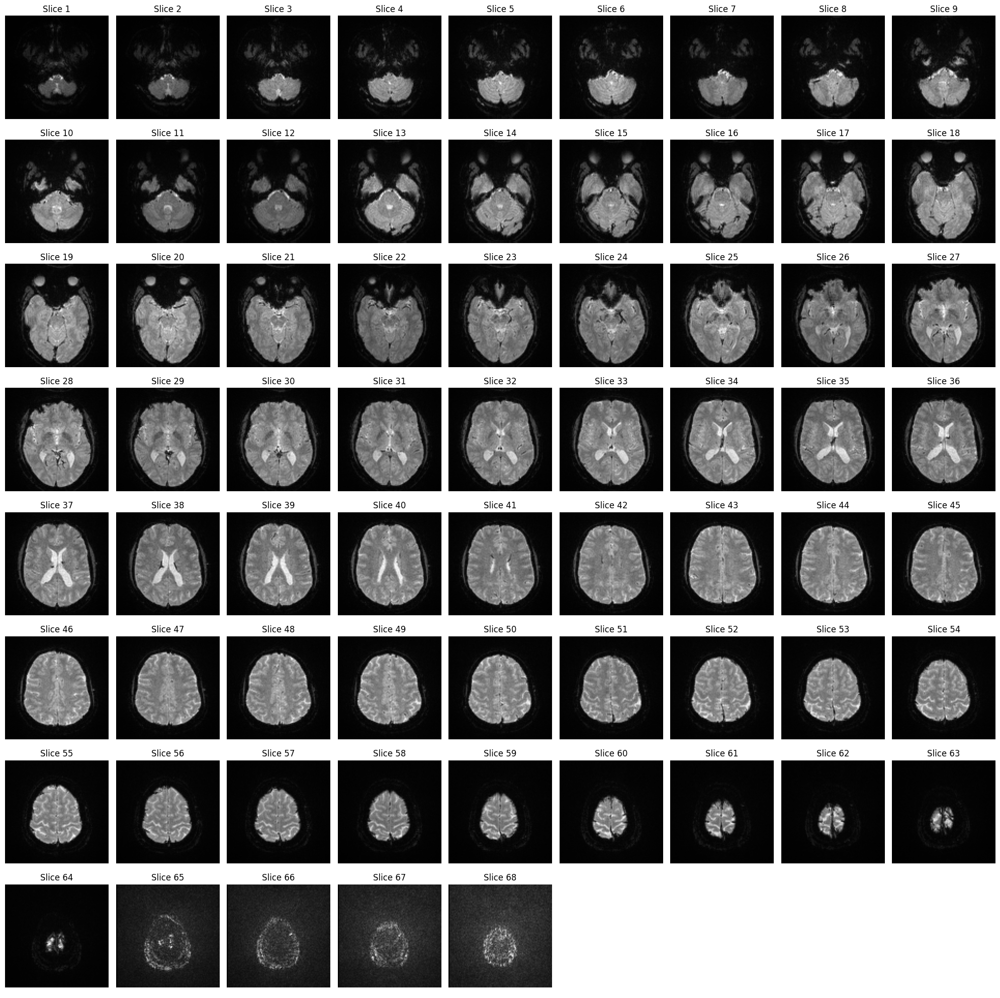

In [4]:
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NII file
# nii_path = "/kaggle/working/preprocessed_fmri_sub1_ses1_nii"
nii_img = smoothed_img

# Get the data as a NumPy array
data = nii_img.get_fdata()

# Define the number of slices
num_slices = data.shape[2]  # Total slices along the z-axis

# Plot all slices
fig, axes = plt.subplots(nrows=8, ncols=9, figsize=(20, 20))  # Grid for displaying 68 slices
axes = axes.flatten()

for i in range(num_slices):
    if i >= len(axes):  
        break
    slice_data = data[:, :, i, 0]  # Assuming first timepoint (index 0)
    axes[i].imshow(slice_data.T, cmap="gray", origin="lower")  # Transpose for correct orientation
    axes[i].set_title(f"Slice {i + 1}")
    axes[i].axis("off")

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


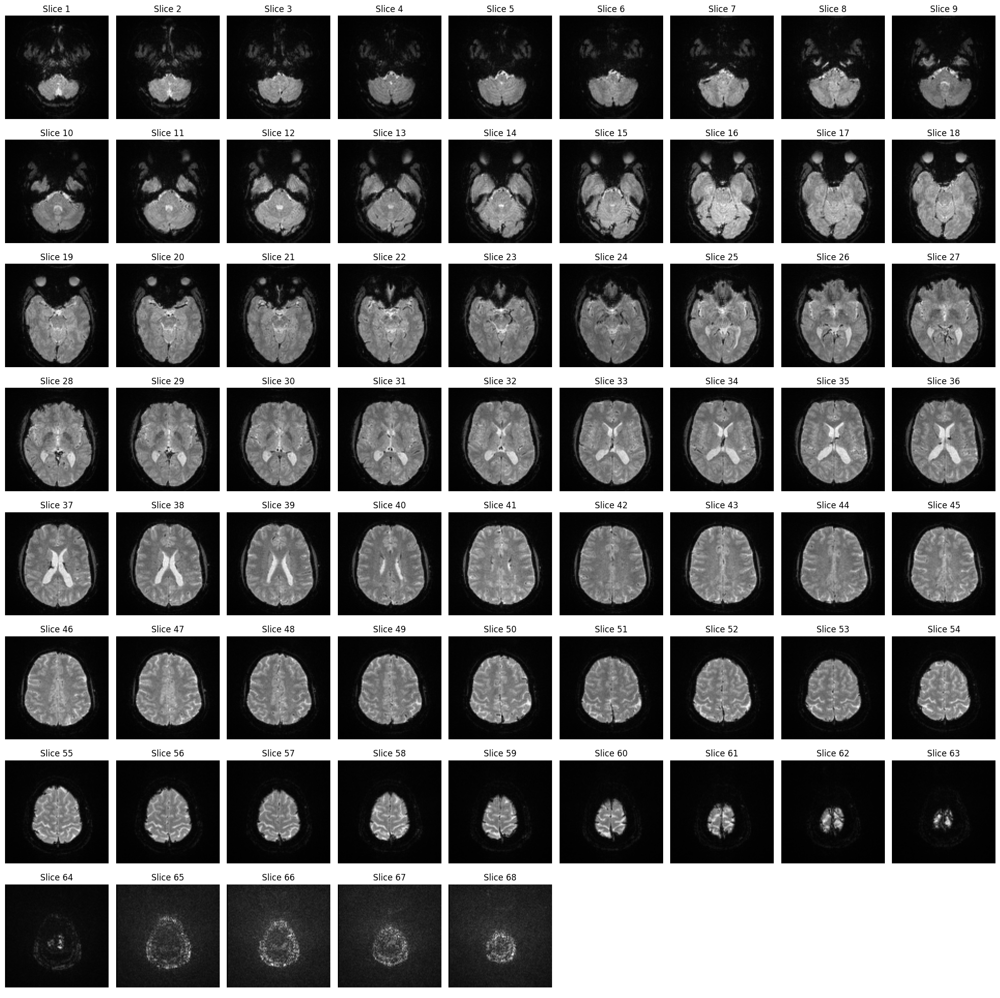

In [46]:
import nibabel as nib
import matplotlib.pyplot as plt

# Load the NII file
# nii_path = "/kaggle/working/preprocessed_fmri_sub1_ses1_nii"
nii_img = fmri_img

# Get the data as a NumPy array
data = nii_img.get_fdata()

# Define the number of slices
num_slices = data.shape[2]  # Total slices along the z-axis

# Plot all slices
fig, axes = plt.subplots(nrows=8, ncols=9, figsize=(20, 20))  # Grid for displaying 68 slices
axes = axes.flatten()

for i in range(num_slices):
    if i >= len(axes):  
        break
    slice_data = data[:, :, i, 0]  # Assuming first timepoint (index 0)
    axes[i].imshow(slice_data.T, cmap="gray", origin="lower")  # Transpose for correct orientation
    axes[i].set_title(f"Slice {i + 1}")
    axes[i].axis("off")

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


Time series shape: (1039,)


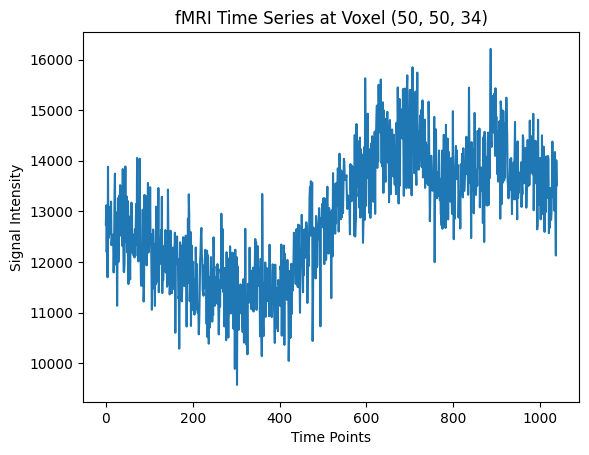

In [54]:
# Select a specific voxel (x, y, z)
x, y, z = 50, 50, 34  # Example coordinates
data = fmri_img.get_fdata()
# Extract the time series for the voxel
time_series = data[x, y, z, :]

# Verify the shape of the time series
print("Time series shape:", time_series.shape)  # Should be (1039,)

# Plot the time series
plt.plot(time_series)
plt.title(f"fMRI Time Series at Voxel ({x}, {y}, {z})")
plt.xlabel("Time Points")
plt.ylabel("Signal Intensity")
plt.show()


Time series shape: (1039,)


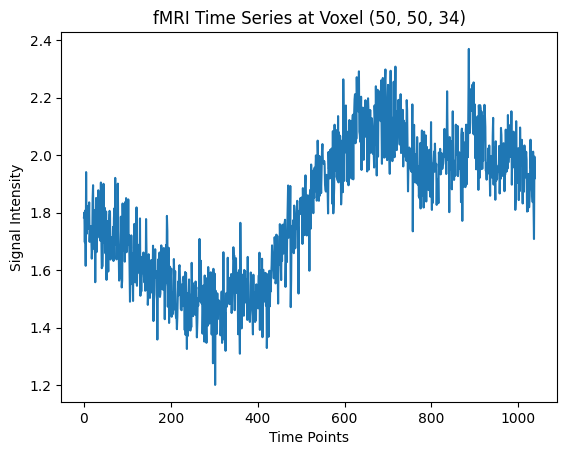

In [49]:
# Select a specific voxel (x, y, z)
x, y, z = 50, 50, 34  # Example coordinates
data = smoothed_img.get_fdata()
# Extract the time series for the voxel
time_series = data[x, y, z, :]

# Verify the shape of the time series
print("Time series shape:", time_series.shape)  # Should be (1039,)

# Plot the time series
plt.plot(time_series)
plt.title(f"fMRI Time Series at Voxel ({x}, {y}, {z})")
plt.xlabel("Time Points")
plt.ylabel("Signal Intensity")
plt.show()


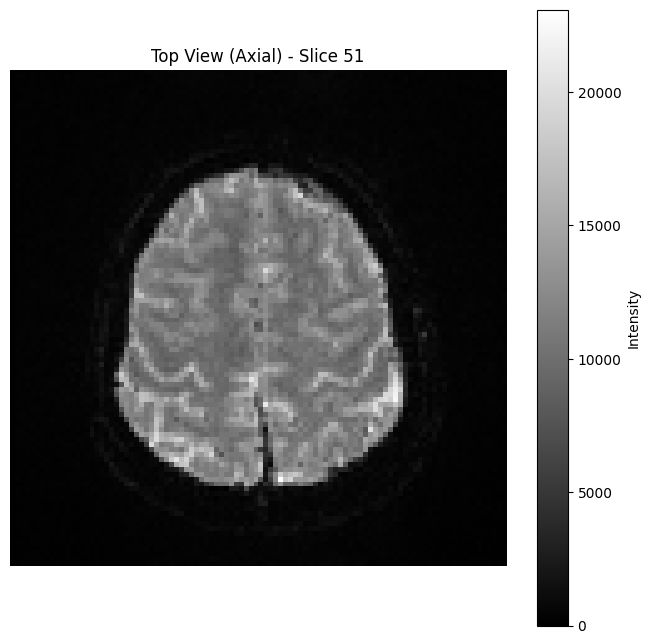

In [44]:
nii_img = fmri_img

# Get the data as a NumPy array
data = nii_img.get_fdata()

# Select the 68th slice along the z-axis (axial view)
slice_index = 50  # Python is 0-indexed, so 68th slice is at index 67
slice_data = data[:, :, slice_index, 0]  # Assuming first timepoint (index 0)

# Plot the slice
plt.figure(figsize=(8, 8))
plt.imshow(slice_data.T, cmap="gray", origin="lower")  # Transpose for correct orientation
plt.title(f"Top View (Axial) - Slice {slice_index + 1}")
plt.colorbar(label="Intensity")
plt.axis("off")
plt.show()

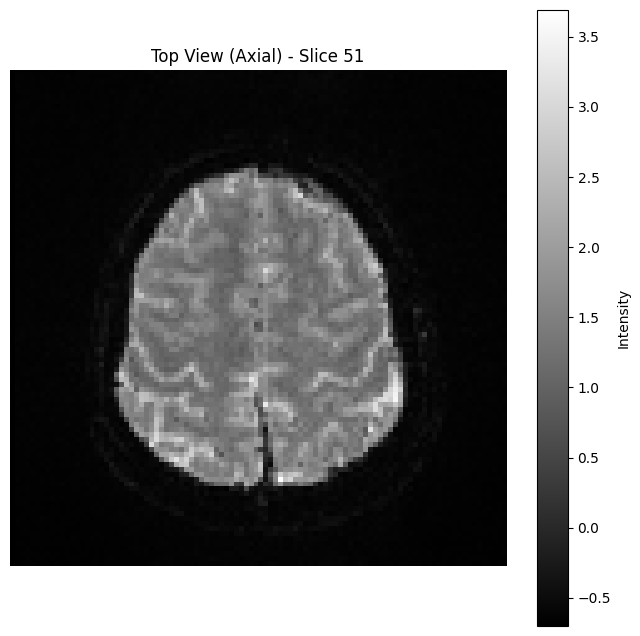

In [7]:
nii_img = smoothed_img

# Get the data as a NumPy array
data = nii_img.get_fdata()

# Select the 68th slice along the z-axis (axial view)
slice_index = 50  # Python is 0-indexed, so 68th slice is at index 67
slice_data = data[:, :, slice_index, 0]  # Assuming first timepoint (index 0)

# Plot the slice
plt.figure(figsize=(8, 8))
plt.imshow(slice_data.T, cmap="gray", origin="lower")  # Transpose for correct orientation
plt.title(f"Top View (Axial) - Slice {slice_index + 1}")
plt.colorbar(label="Intensity")
plt.axis("off")
plt.show()

# **Failed to download**
dont need to run the below code beffore segmentation


In [9]:
!zip -r preprocessed_fmri_Sub1_ses1.zip /kaggle/working/preprocessed_fmri_Sub1_ses1.nii


updating: kaggle/working/preprocessed_fmri_Sub1_ses1.nii^C



zip error: Interrupted (aborting)


In [10]:
import nibabel as nib

# Specify the output path with .nii.gz extension
output_path = "/kaggle/working/preprocessed_fmri_Sub1_ses1.nii.gz"

# Save the smoothed image as a .gz compressed NIfTI file
nib.save(smoothed_img, output_path)

# Print the confirmation message
print(f"Preprocessed fMRI saved at {output_path}")


Preprocessed fMRI saved at /kaggle/working/preprocessed_fmri_Sub1_ses1.nii.gz


In [12]:
from IPython.display import FileLink

# Path to the file you want to download
file_path = '/kaggle/working/preprocessed_fmri_Sub1_ses1.nii.gz'

# Create a clickable link to download the file
FileLink(file_path)


/kaggle/working/preprocessed_fmri_Sub1_ses1.nii.gz

# Segmentation

In [10]:
smoothed_img.shape

(100, 100, 68, 1039)

In [7]:
sub1_ses1_processed_nii=smoothed_img
sub1_ses1_events='/kaggle/input/fmri-tasks-time/sub-02_ses-01_task-inner_events.tsv'

In [10]:
import pandas as pd
import nibabel as nib
import numpy as np

# Load the preprocessed NIfTI image
processed_nii = smoothed_img  # Already preprocessed (smoothed_img)
nii_data = processed_nii.get_fdata()  # Extract voxel data
selected_slices = [30, 33, 36, 39, 42, 45, 48, 51, 54]  # Desired slices

# Load the events.tsv file
events_path = '/kaggle/input/fmri-tasks-time/sub-01_ses-01_task-inner_events.tsv'
events = pd.read_csv(events_path, sep='\t')

# Step 1: Handle `n/a` trials and missing trial types
events = events[events['trial_type'].notna()]  # Remove rows with NaN in 'trial_type'
events = events[events['trial_type'] != 'n/a']  # Remove rows with `n/a` trial_type

# Step 2: Convert onset and duration to time indices
TR = 2.16  # Repetition time from metadata
events['onset_idx'] = (events['onset'] / TR).round().astype(int)  # Start index
events['end_idx'] = ((events['onset'] + events['duration']) / TR).round().astype(int)  # End index

# Step 3: Filter trials with insufficient time points
events = events[events['end_idx'] - events['onset_idx'] >= 7]  # At least 7 time points

# Step 4: Select 5 time points per task (ignore first and last points)
def select_time_points(row):
    return list(range(row['onset_idx'] + 1, row['onset_idx'] + 6))  # Exclude first, pick next 5

events['time_points'] = events.apply(select_time_points, axis=1)

# Step 5: Segment data
segmented_data = []  # List to store segmented trials
labels = []  # Corresponding labels for each trial

for _, row in events.iterrows():
    for t in row['time_points']:
        # Extract data for selected slices and the current time point
        trial_segment = nii_data[:, :, selected_slices, t]
        segmented_data.append(trial_segment)
        labels.append(row['trial_type'])

segmented_data = np.array(segmented_data)  # Convert to numpy array
labels = np.array(labels)  # Convert labels to numpy array

# Step 6: Save the segmented data and labels
output_data_path = '/kaggle/working/segmented_fmri_data.npy'
output_labels_path = '/kaggle/working/segmented_labels.npy'

np.save(output_data_path, segmented_data)
np.save(output_labels_path, labels)

print(f"Segmented data saved to {output_data_path}")


Segmented data saved to /kaggle/working/segmented_fmri_data.npy
Labels saved to /kaggle/working/segmented_labels.npy


In [17]:
segmented_data.shape

(385, 100, 100, 9)

In [18]:
labels.shape

(385,)

Visualizing Segment 1/5


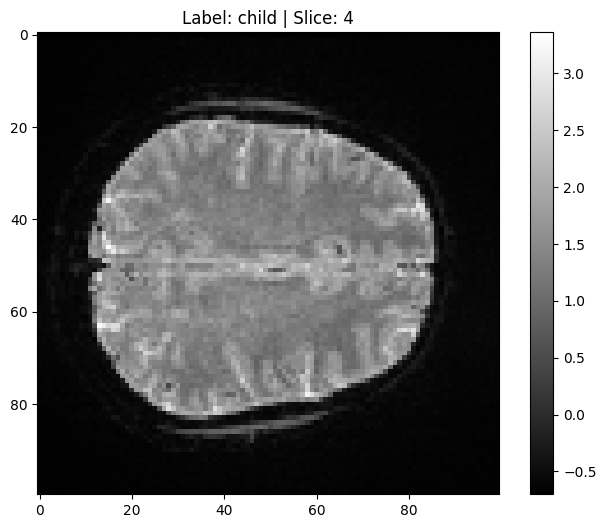

Visualizing Segment 2/5


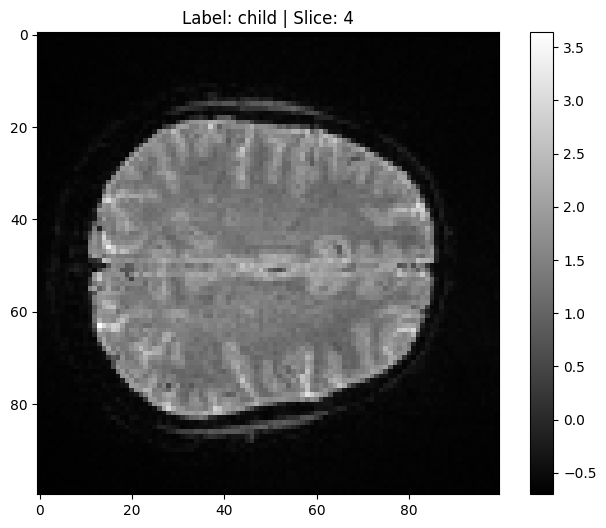

Visualizing Segment 3/5


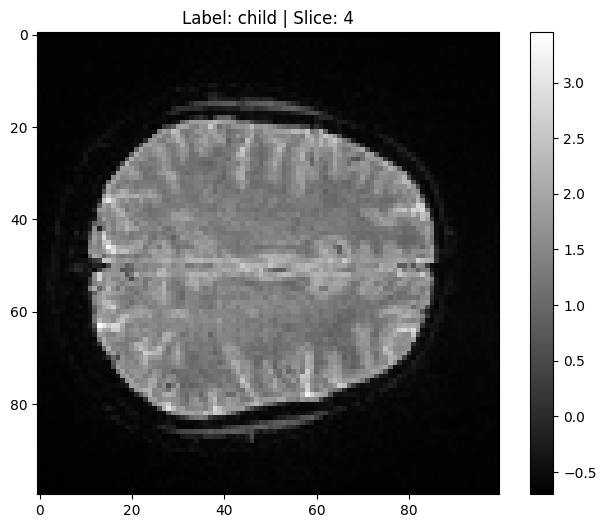

Visualizing Segment 4/5


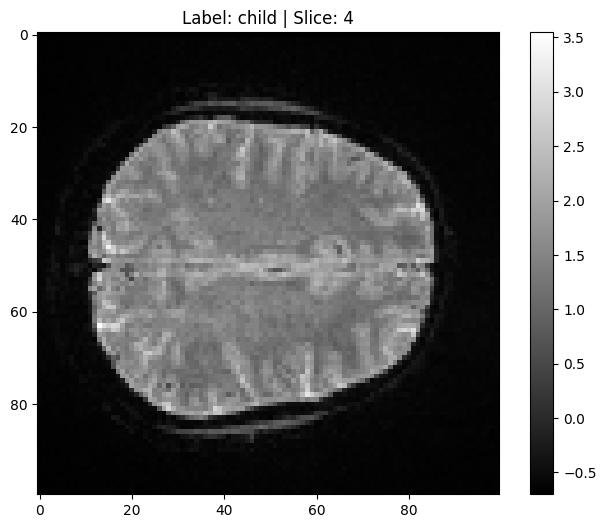

Visualizing Segment 5/5


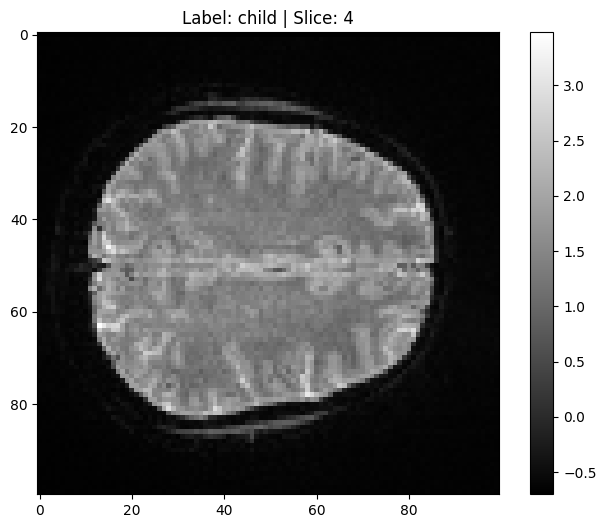

In [12]:
import numpy as np
import matplotlib.pyplot as plt

# Paths to the saved files
data_path = '/kaggle/working/segmented_fmri_data.npy'
labels_path = '/kaggle/working/segmented_labels.npy'

# Load segmented data and labels
segmented_data = np.load(data_path)  # Shape: (num_segments, height, width, num_slices)
labels = np.load(labels_path)  # Shape: (num_segments,)

# Helper function to visualize a single segment
def visualize_segment(segment, label, slice_idx):
    """
    Visualize a single segment with its label.
    Args:
    - segment: 3D array of shape (height, width, num_slices).
    - label: Label corresponding to the segment.
    - slice_idx: Index of the slice to visualize.
    """
    plt.figure(figsize=(8, 6))
    plt.imshow(segment[:, :, slice_idx], cmap='gray')
    plt.title(f"Label: {label} | Slice: {slice_idx}")
    plt.colorbar()
    plt.show()

# Visualize some samples
num_samples_to_visualize = 5  # Adjust as needed
selected_slice = 4  # Middle slice index to visualize (index within `selected_slices`)

for i in range(num_samples_to_visualize):
    print(f"Visualizing Segment {i+1}/{num_samples_to_visualize}")
    visualize_segment(segmented_data[i], labels[i], selected_slice)


In [25]:
import pandas as pd
import numpy as np

# Variables
sub1_ses1_processed_nii = smoothed_img  # Assuming this is a nibabel NIfTI object
sub1_ses1_events_path = '/kaggle/input/fmri-tasks-time/sub-01_ses-01_task-inner_events.tsv'

# Load the events file
events = pd.read_csv(sub1_ses1_events_path, sep='\t')

# fMRI data dimensions (get the numpy array from the NIfTI object)
fmri_data = sub1_ses1_processed_nii.get_fdata()  # Shape: (100, 100, 68, 1039)
z_slices = [30, 33, 36, 39, 42, 45, 48, 51, 54]  # Desired slices

# Initialize storage for segmented data
segmented_data = []
labels = []

# Iterate through events
for _, row in events.iterrows():
    trial_type = row['trial_type']
    # print(trial_type)
    
    # Skip rows with 'n/a' trial type
    # if trial_type == 'nan':  
    #     continue

    if pd.isna(trial_type) or trial_type == 'nan':  
        continue
    
    onset = row['onset']
    duration = row['duration']
    
    # Calculate start and end indices for the time points
    start_time = onset
    end_time = onset + duration
    start_idx = int(np.floor(start_time / 2.16))  # Convert seconds to TR indices
    end_idx = int(np.floor(end_time / 2.16))
    
    # Select the first 5 time points for this trial
    time_indices = list(range(start_idx, start_idx + 5))
    
    # Extract 9 slices for each time point
    for t in time_indices:
        if t < fmri_data.shape[3]:  # Ensure we don't exceed the time dimension
            slice_data = fmri_data[:, :, z_slices, t]  # Extract the data for these slices and time point
            segmented_data.append(slice_data)
            labels.append(trial_type)  # Store the corresponding label for each segment

# Convert segmented_data to a numpy array (shape: instances, 100, 100, 9)
segmented_data = np.array(segmented_data)  # Shape: (instances, 100, 100, 9)

# Convert labels to a numpy array for later use (if needed)
labels = np.array(labels)

# Print the shape of the segmented data
print(f"Shape of segmented data: {segmented_data.shape}")
print(f"Shape of labels: {labels.shape}")

# Optionally, you can save the array to a file, for example using np.save
output_data_path = '/kaggle/working/segmented_sub1_ses1.npy'
output_labels_path = '/kaggle/working/labels_sub1_ses1.npy'

# Save the segmented data and labels to numpy files
np.save(output_data_path, segmented_data)
np.save(output_labels_path, labels)

print(f"Segmented data saved at {output_data_path}")
print(f"Labels saved at {output_labels_path}")


Shape of segmented data: (800, 100, 100, 9)
Shape of labels: (800,)
Segmented data saved at /kaggle/working/segmented_sub1_ses1.npy
Labels saved at /kaggle/working/labels_sub1_ses1.npy


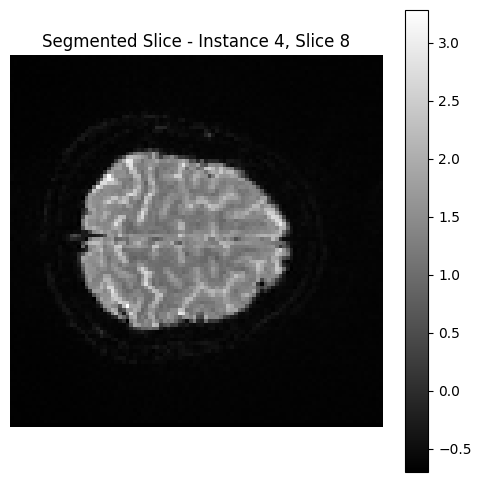

Label for this segment: four


In [26]:
import matplotlib.pyplot as plt

# Select a sample instance and slice index to visualize
sample_instance = 4  # You can change this index to visualize different instances
sample_slice_index = 8  # You can change this index to visualize a different slice

# Extract the 9th slice (for example)
slice_image = segmented_data[sample_instance, :, :, sample_slice_index]  # Shape: (100, 100)

# Plot the slice
plt.figure(figsize=(6, 6))
plt.imshow(slice_image, cmap='gray', origin='lower')
plt.colorbar()
plt.title(f"Segmented Slice - Instance {sample_instance}, Slice {sample_slice_index}")
plt.axis('off')  # Hide the axes
plt.show()

# Optionally display the label for the instance
print(f"Label for this segment: {labels[sample_instance]}")


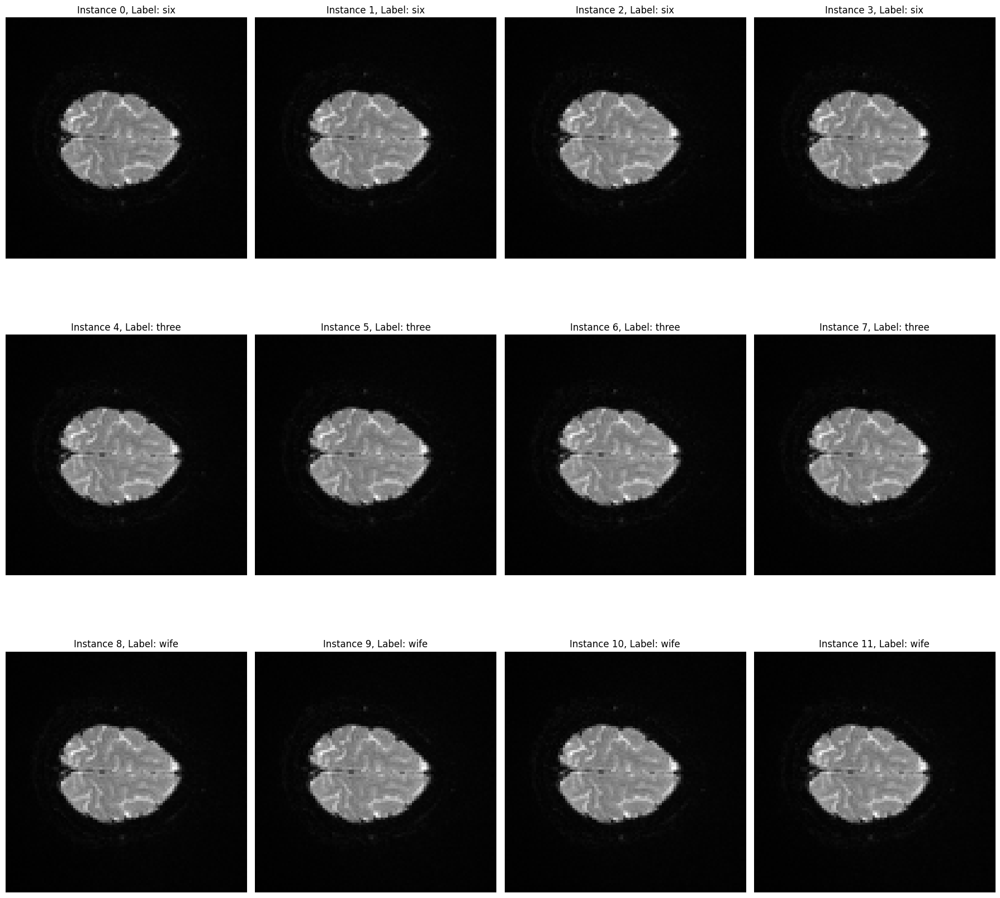

Label for instance 0: six
Label for instance 1: six
Label for instance 2: six
Label for instance 3: six
Label for instance 4: three
Label for instance 5: three
Label for instance 6: three
Label for instance 7: three
Label for instance 8: wife
Label for instance 9: wife
Label for instance 10: wife
Label for instance 11: wife


In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Number of images to visualize
num_images = 12  # You can adjust this number to display more or fewer images

# Select a sample instance and slice index to visualize
fig, axes = plt.subplots(3, 4, figsize=(18, 18))  # 3x3 grid for example
axes = axes.ravel()

# Loop through the selected number of images to display
for i in range(num_images):
    sample_instance = i  # Visualizing different instances, change the range as needed
    sample_slice_index = 8  # You can change this index to visualize a different slice
    
    # Extract the slice
    slice_image = segmented_data[sample_instance, :, :, sample_slice_index]  # Shape: (100, 100)
    
    # Plot each slice
    ax = axes[i]
    ax.imshow(slice_image, cmap='gray', origin='lower')
    ax.set_title(f"Instance {sample_instance}, Label: {labels[sample_instance]}")
    ax.axis('off')  # Hide the axes

# Adjust layout
plt.tight_layout()
plt.show()

# Optionally display labels for the instances
for i in range(num_images):
    print(f"Label for instance {i}: {labels[i]}")

In [7]:
smoothed_img.shape

(100, 100, 68, 1039)

In [5]:
import pandas as pd
import numpy as np

# Variables
sub1_ses1_processed_nii = smoothed_img  # Assuming this is a nibabel NIfTI object
sub1_ses1_events_path = '/kaggle/input/fmri-tasks-time/sub-05_ses-01_task-inner_events.tsv'

# Load the events file
events = pd.read_csv(sub1_ses1_events_path, sep='\t')

# fMRI data dimensions (get the numpy array from the NIfTI object)
fmri_data = sub1_ses1_processed_nii.get_fdata()  # Shape: (100, 100, 68, 1039)
z_slices = [30, 33, 36, 39, 42, 45, 48, 51, 54]  # Desired slices

# Initialize storage for segmented data
segmented_data = []
labels = []

# Iterate through events
for _, row in events.iterrows():
    trial_type = row['trial_type']
    # print(trial_type)
    
    # Skip rows with 'n/a' trial type
    # if trial_type == 'nan':  
    #     continue

    if pd.isna(trial_type) or trial_type == 'nan':  
        continue
    
    onset = row['onset']
    duration = row['duration']
    
    # Calculate start and end indices for the time points
    start_time = onset
    end_time = onset + duration
    start_idx = int(np.floor(start_time / 2.16))  # Convert seconds to TR indices
    end_idx = int(np.floor(end_time / 2.16))
    
    # Select the first 4 time points for this trial
    time_indices = list(range(start_idx, start_idx + 4))
    
    # Extract 9 slices for each time point
    for t in time_indices:
        if t < fmri_data.shape[3]:  # Ensure we don't exceed the time dimension
            slice_data = fmri_data[:, :, z_slices, t]  # Extract the data for these slices and time point
            segmented_data.append(slice_data)
            labels.append(trial_type)  # Store the corresponding label for each segment

# Convert segmented_data to a numpy array (shape: instances, 100, 100, 9)
segmented_data = np.array(segmented_data)  # Shape: (instances, 100, 100, 9)

# Convert labels to a numpy array for later use (if needed)
labels = np.array(labels)

# Print the shape of the segmented data
print(f"Shape of segmented data: {segmented_data.shape}")
print(f"Shape of labels: {labels.shape}")

# Optionally, you can save the array to a file, for example using np.save
output_data_path = '/kaggle/working/segmented_sub5_ses1.npy'
output_labels_path = '/kaggle/working/labels_sub5_ses1.npy'

# Save the segmented data and labels to numpy files
np.save(output_data_path, segmented_data)
np.save(output_labels_path, labels)

print(f"Segmented data saved at {output_data_path}")
print(f"Labels saved at {output_labels_path}")


Shape of segmented data: (640, 100, 100, 9)
Shape of labels: (640,)
Segmented data saved at /kaggle/working/segmented_sub5_ses1.npy
Labels saved at /kaggle/working/labels_sub5_ses1.npy
